# Programming for Data Analysis - Project

For this project you must create a data set by simulating a real-world phenomenon of your choosing. Then, rather than collect data related to the phenomenon, you should model and synthesise such data using Python.

Specifically, in this project you should:
• Choose a real-world phenomenon that can be measured and for which you could collect at least one-hundred data points across at least four different variables.
• Investigate the types of variables involved, their likely distributions, and their relationships with each other.
• Synthesise/simulate a data set as closely matching their properties as possible.
• Detail your research and implement the simulation in a Jupyter notebook – the data set itself can simply be displayed in an output cell within the notebook.

Note that this project is about simulation – you must synthesise a data set. Some students may already have some real-world data sets in their own files. It is okay to base your synthesised data set on these should you wish (please reference it if you do), but the main task in this project is to create a synthesised data set.


## Table of Contents

## Introduction

Proteins are complex molecules (macromolecules) responsible for performing a multitude of biological functions. These include keratin, collagen...

An important aspect in understanding how the protein structures relate to their molecular function..Structural biology, an umbrella term used to describe the application of experimental techniques such as X-ray and neutron crystallography and electron microscopy...

However, experimental techniques suffer from inherent drawbacks - they require highly-pure and stable physical samples that can be difficult to obtain in sufficient quantities, and human expertise to convert data to three-dimensional models that can be instinctively interpreted by human.

Computational biology approaches is one way to overcome these drawbacks. By making certain assumptions, we can use computers to solve structures. In order to judge the performance of various algorithms, CASP has been organized by the structural biology community as an open venue to learn from each other...

In this notebook, we will look at the distribtion....

In order to not reinvent the wheel, we will use pre-existing Python libraries to explore the dataset, and use the known relationships to generate a synthetic dataset.



In [4]:
import numpy as np
# import scipy as sp
import matplotlib.pyplot as plt
%matplotlib notebook
import pandas as pd
df = pd.read_csv("CASP.csv") # http://archive.ics.uci.edu/ml/datasets/Physicochemical+Properties+of+Protein+Tertiary+Structure
import seaborn as sns

# to make interactive plots with plotly
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode(connected=True)
from plotly import tools

# https://pypi.org/project/fitter/
from scipy import stats 
from fitter import Fitter

from pylab import *
from scipy.optimize import curve_fit
import scipy.interpolate as interpolate

We will first look at the data structure and make modifications as required.

In [3]:
df

,RMSD,F1,F2,F3,F4,F5,F6,F7,F8,F9
0,17.284,13558.30,4305.35,0.31754,162.1730,1.872791e+06,215.3590,4287.87,102,27.0302
1,6.021,6191.96,1623.16,0.26213,53.3894,8.034467e+05,87.2024,3328.91,39,38.5468
2,9.275,7725.98,1726.28,0.22343,67.2887,1.075648e+06,81.7913,2981.04,29,38.8119
3,15.851,8424.58,2368.25,0.28111,67.8325,1.210472e+06,109.4390,3248.22,70,39.0651
4,7.962,7460.84,1736.94,0.23280,52.4123,1.021020e+06,94.5234,2814.42,41,39.9147
5,1.700,5117.30,1120.99,0.21905,51.6732,6.727227e+05,79.5911,3234.21,15,41.2382
6,9.314,5924.16,1625.27,0.27434,70.2103,8.285145e+05,76.8064,2821.40,70,39.4964
7,1.985,6882.15,1791.22,0.26027,77.2501,9.165165e+05,96.6785,3490.88,74,37.4203
8,1.915,12090.00,4190.74,0.34662,129.0020,1.687508e+06,186.3090,4262.78,39,30.3916
9,1.495,7400.24,1881.95,0.25430,82.9320,1.023846e+06,104.6970,3852.40,26,35.4140


From above, we can determine that we have 10 columns (RMSD and F1-F9) of 45730 rows (data points) each. Except for the first column, the others are non-descriptive and should be renamed so avoid confusion later on.

In [13]:
# rename columns based on information from the UCI webpage
# F1 - Total surface area. 
# F2 - Non polar exposed area. 
# F3 - Fractional area of exposed non polar residue. 
# F4 - Fractional area of exposed non polar part of residue. 
# F5 - Molecular mass weighted exposed area. 
# F6 - Average deviation from standard exposed area of residue. 
# F7 - Euclidian distance. 
# F8 - Secondary structure penalty. 
# F9 - Spacial Distribution constraints (N,K Value).
df.rename(columns={'F1': 'Total surface area',
                   'F2': 'Non-polar exposed area',
                   'F3': 'Fractional area of exposed non polar residue',
                   'F4': 'Fractional area of exposed non polar part of residue',
                   'F5': 'Molecular mass weighted exposed area',
                   'F6': 'Average deviation from standard exposed area of residue',
                   'F7': 'Euclidian distance',
                   'F8': 'Secondary structure penalty',
                   'F9': 'Spacial Distribution constraints (N,K Value)'
                  }, inplace = True)

df.corr() # calculate correlation between variables

,RMSD,Total surface area,Non-polar exposed area,Fractional area of exposed non polar residue,Fractional area of exposed non polar part of residue,Molecular mass weighted exposed area,Average deviation from standard exposed area of residue,Euclidian distance,Secondary structure penalty,"Spacial Distribution constraints (N,K Value)"
RMSD,1.000000,-0.015087,0.156895,0.374309,-0.169771,-0.013982,-0.036135,-0.003339,0.000344,0.062830
Total surface area,-0.015087,1.000000,0.906606,0.126285,0.931056,0.998185,0.967531,0.554002,0.651251,-0.898240
Non-polar exposed area,0.156895,0.906606,1.000000,0.502562,0.793143,0.902853,0.908354,0.515929,0.584242,-0.786188
Fractional area of exposed non polar residue,0.374309,0.126285,0.502562,1.000000,0.031230,0.122622,0.200650,0.080064,0.095340,-0.069039
Fractional area of exposed non polar part of residue,-0.169771,0.931056,0.793143,0.031230,1.000000,0.925707,0.938108,0.485185,0.676919,-0.891766
Molecular mass weighted exposed area,-0.013982,0.998185,0.902853,0.122622,0.925707,1.000000,0.961769,0.553729,0.642961,-0.897765
Average deviation from standard exposed area of residue,-0.036135,0.967531,0.908354,0.200650,0.938108,0.961769,1.000000,0.538198,0.662584,-0.881973
Euclidian distance,-0.003339,0.554002,0.515929,0.080064,0.485185,0.553729,0.538198,1.000000,0.347030,-0.521148
Secondary structure penalty,0.000344,0.651251,0.584242,0.095340,0.676919,0.642961,0.662584,0.347030,1.000000,-0.637287
"Spacial Distribution constraints (N,K Value)",0.062830,-0.898240,-0.786188,-0.069039,-0.891766,-0.897765,-0.881973,-0.521148,-0.637287,1.000000


The table above shows the correlation coefficents between two variables for all the variables. However, it is too 'numerical' for a good interpretation. A better option is to use Seaborn to construct a heat map.



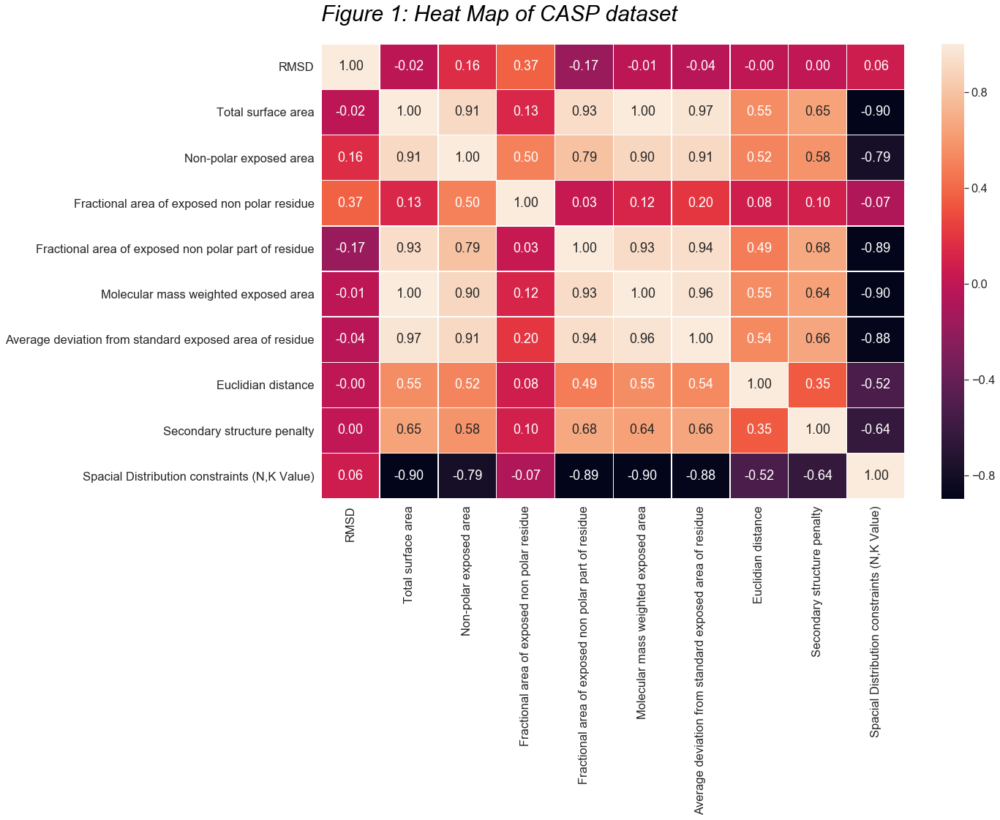

In [5]:
sns.set(font_scale=1.5)
plt.figure(figsize=(15,15)) 
plt.text(0,-0.5, "Figure 1: Heat Map of CASP dataset", fontsize = 30, color='Black', fontstyle='italic')
plt.tight_layout()

# according to the docs https://seaborn.pydata.org/generated/seaborn.heatmap.html and
# http://alanpryorjr.com/visualizations/seaborn/heatmap/heatmap/
# we can use linewidths to create some spacing between the cells and
# fmt (format) to round 2 decimal points
sns.heatmap(df.corr(), annot=True, linewidths = 0.5, fmt='.2f')

We can make the following observations:

1. RMSD is poorly correlated with any of the other variables.
1. There is a strong positive correlation between Total surface area and non-polar exposed area, Fractional area of exposed non-polar part of residue, Molecular mass weighted exposed area, Average deviation from standard exposed area of residue, and strong negative correlation with spatial distribution constraints.
1. With the exception of RMSD and Fractional area of exposed non-polar residue, all variables have strong correlation with the spatial distribution constraints.

Based on the variable labels and the correlation coefficients above, it seems likely that some variables could be collinear, rather than truly correlated. A multivariate analysis using the `pairplot()` function can shed some light here.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\matplotlib\tight_layout.py:199: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



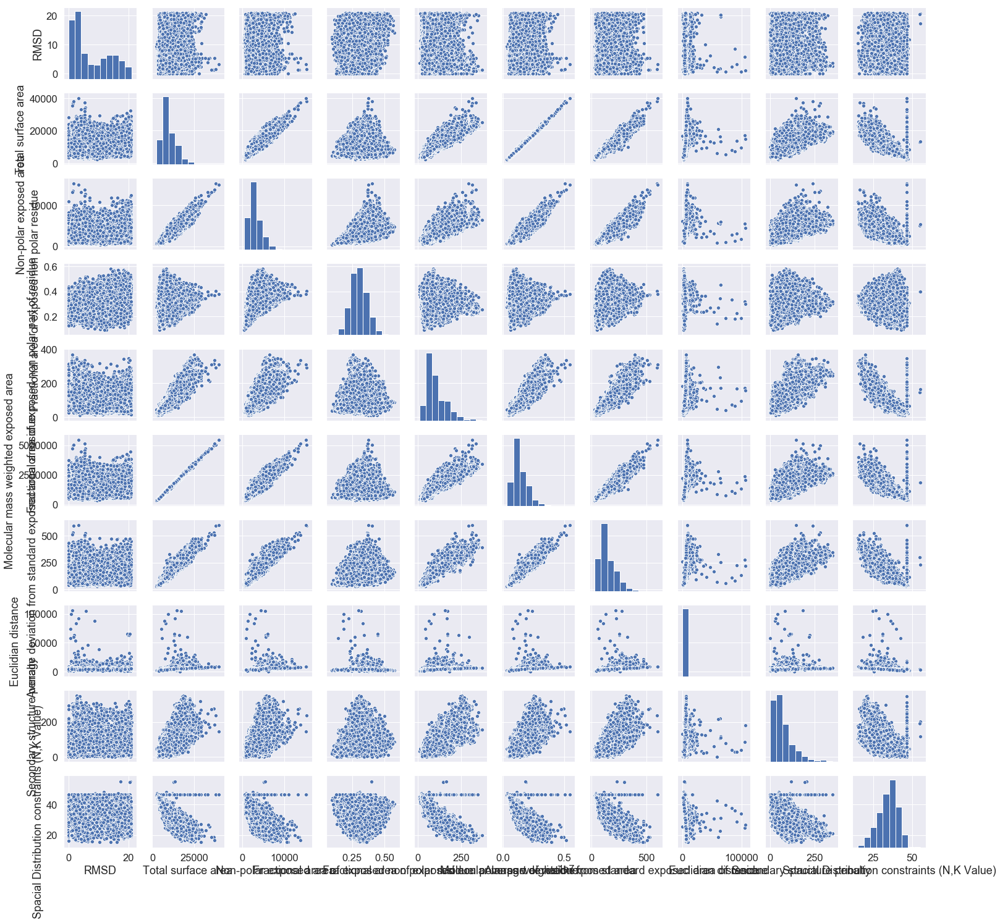

In [6]:
sns.pairplot(df)

It could be caused by the calculations used to determine the total surface area, which presumably is a function of xx and yy (addition).

In any case, we should look at the distribution of each variable. Scipy comes with many well-known distributions PDF, which each function takes usually two parameters - scale to control xx and loc to control mean.

While we could manually fit each distribution for each variable, we can use the `fitter` module to automatically generate the curves for us. In essence, `fitter` uses Scipy curve_fit to do xx and yy...

Let's fit the RMSD first

In [3]:
RMSD_values = df['RMSD'] # get all RMSD values

f_RMSD = Fitter(RMSD_values)
f_RMSD.fit()

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\fitter\fitter.py:144: VisibleDeprecationWarning:

Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:2305: RuntimeWarning:

invalid value encountered in double_scalars



Fitted alpha distribution with error=0.08421849856291073)
Fitted anglit distribution with error=0.19268318371304236)
Fitted arcsine distribution with error=0.24247688142304033)
Fitted argus distribution with error=0.22155219998885542)
Fitted beta distribution with error=0.16191152147489385)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:589: RuntimeWarning:

divide by zero encountered in true_divide

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:593: RuntimeWarning:

divide by zero encountered in true_divide

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:1037: RuntimeWarning:

invalid value encountered in subtract



Fitted betaprime distribution with error=0.10465499096370028)
Fitted bradford distribution with error=0.13687332076021247)
Fitted burr distribution with error=0.12564205332488165)
Fitted burr12 distribution with error=0.1101014861057981)
Fitted cauchy distribution with error=0.15401670458719346)
Fitted chi distribution with error=0.1257240749683678)
Fitted chi2 distribution with error=0.7336450327611833)
Fitted cosine distribution with error=0.19518516551679505)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:6428: RuntimeWarning:

overflow encountered in power

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:6428: RuntimeWarning:

invalid value encountered in multiply



Fitted crystalball distribution with error=0.19741875987485566)
Fitted dgamma distribution with error=0.15292371355877094)
Fitted dweibull distribution with error=0.13417303205055886)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 12.600000000000001.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 12.400000000000002.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 11.666666666666668.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 12.366666666666667.

E:\Program Files (x86)\M

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 1.313328360378468.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 1.3418726166959611.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 1.3494038375800868.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 1.4245920746843683.

E:\Program Files (x86)\Mi

Fitted erlang distribution with error=0.10442593858786538)
Fitted expon distribution with error=0.11801547213859427)
Fitted exponnorm distribution with error=0.07132523696220493)
Fitted exponpow distribution with error=0.1287610959889153)
Fitted exponweib distribution with error=0.1250471758740777)
Fitted f distribution with error=0.2379033922124224)
Fitted fatiguelife distribution with error=0.07623983639822411)
Fitted fisk distribution with error=0.0903936912590437)
Fitted foldcauchy distribution with error=0.10892310706499621)
Fitted foldnorm distribution with error=0.1281219452229234)
Fitted frechet_l distribution with error=1.3656803169677871)
Fitted frechet_r distribution with error=0.29343392505043825)
Fitted gamma distribution with error=0.10442667352984937)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:3080: RuntimeWarning:

divide by zero encountered in power



Fitted gausshyper distribution with error=0.10689435013178003)
Fitted genexpon distribution with error=0.09181931005660063)
Fitted genextreme distribution with error=0.08310572050320607)
Fitted gengamma distribution with error=0.11976535693163576)
Fitted genhalflogistic distribution with error=0.14065774605943063)
Fitted genlogistic distribution with error=0.16437428985796518)
Fitted gennorm distribution with error=0.1636815644777222)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2159: RuntimeWarning:

divide by zero encountered in true_divide



Fitted genpareto distribution with error=0.12739738143855223)
Fitted gilbrat distribution with error=0.07471011949933573)
Fitted gompertz distribution with error=0.12507523583977148)
Fitted gumbel_l distribution with error=0.21780594216452862)
Fitted gumbel_r distribution with error=0.16421027370357294)
Fitted halfcauchy distribution with error=0.11082861548840295)
Fitted halfgennorm distribution with error=0.20546693086205065)
Fitted halflogistic distribution with error=0.12056602421568154)
Fitted halfnorm distribution with error=0.12616820527785969)
Fitted hypsecant distribution with error=0.19734469430005933)
Fitted invgamma distribution with error=0.08618787180466449)
Fitted invgauss distribution with error=0.07864437017017649)
Fitted invweibull distribution with error=0.08310424766729294)
Fitted johnsonsb distribution with error=0.09794909601851795)
Fitted johnsonsu distribution with error=0.08234493946356634)
Fitted kappa3 distribution with error=0.15684604439994543)
Fitted kappa

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\integrate\quadpack.py:385: IntegrationWarning:

The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:44: RuntimeWarning:

floating point number truncated to an integer



SKIPPED ksone distribution (taking more than 30 seconds)
Fitted kstwobign distribution with error=0.16060621814422518)
Fitted laplace distribution with error=0.1808040682733676)
Fitted levy distribution with error=0.10306350982861189)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:1615: RuntimeWarning:

divide by zero encountered in log



Fitted levy_l distribution with error=0.28280794285291555)
SKIPPED levy_stable distribution (taking more than 30 seconds)
Fitted loggamma distribution with error=0.19508114520105238)
Fitted logistic distribution with error=0.198377203907447)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:3785: RuntimeWarning:

divide by zero encountered in true_divide



Fitted loglaplace distribution with error=0.42100889880628756)
Fitted lognorm distribution with error=0.08394356675609117)
Fitted lomax distribution with error=0.12515955338342902)
Fitted maxwell distribution with error=0.18360118061126432)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\integrate\quadpack.py:385: IntegrationWarning:

Extremely bad integrand behavior occurs at some points of the
  integration interval.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\integrate\quadpack.py:385: IntegrationWarning:

The integral is probably divergent, or slowly convergent.



Fitted mielke distribution with error=0.13650160469778833)
Fitted moyal distribution with error=0.14407891031741737)
Fitted nakagami distribution with error=0.12794702621546575)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:1615: RuntimeWarning:

invalid value encountered in log



SKIPPED ncf distribution (taking more than 30 seconds)
SKIPPED nct distribution (taking more than 30 seconds)
SKIPPED ncx2 distribution (taking more than 30 seconds)
Fitted norm distribution with error=0.19741876036069558)
Fitted norminvgauss distribution with error=0.078600456037662)
Fitted pareto distribution with error=0.1291760278961276)
Fitted pearson3 distribution with error=0.10442601323294506)
Fitted powerlaw distribution with error=0.15044985251336704)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5166: RuntimeWarning:

divide by zero encountered in power

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5166: RuntimeWarning:

overflow encountered in power

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5166: RuntimeWarning:

invalid value encountered in multiply



Fitted powerlognorm distribution with error=0.08724609919431141)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5203: RuntimeWarning:

divide by zero encountered in power

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5203: RuntimeWarning:

invalid value encountered in multiply



Fitted powernorm distribution with error=nan)
Fitted rayleigh distribution with error=0.17708539871647114)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5250: RuntimeWarning:

divide by zero encountered in power



Fitted rdist distribution with error=0.16779286495972145)
Fitted recipinvgauss distribution with error=0.08291647159884365)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5358: RuntimeWarning:

invalid value encountered in log



Fitted reciprocal distribution with error=0.4438987678176207)
Fitted rice distribution with error=0.17708452018823492)
SKIPPED rv_continuous distribution (taking more than 30 seconds)
SKIPPED rv_histogram distribution (taking more than 30 seconds)
Fitted semicircular distribution with error=0.18761658480497542)
Fitted skewnorm distribution with error=0.1157785821033895)
Fitted t distribution with error=0.19743126778507877)
Fitted trapz distribution with error=0.29371455868987306)
Fitted triang distribution with error=0.10753843042626257)
Fitted truncexpon distribution with error=0.13335701067392597)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5823: RuntimeWarning:

divide by zero encountered in log

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5823: RuntimeWarning:

invalid value encountered in log



Fitted truncnorm distribution with error=0.19741876030997893)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5883: RuntimeWarning:

divide by zero encountered in power



SKIPPED tukeylambda distribution (taking more than 30 seconds)
Fitted uniform distribution with error=0.16896859110142204)
Fitted vonmises distribution with error=1.906640606105756e+53)
Fitted vonmises_line distribution with error=0.16899065486588113)
Fitted wald distribution with error=0.07172441553021672)
Fitted weibull_max distribution with error=1.3656803169677871)
Fitted weibull_min distribution with error=0.29343392505043825)
Fitted wrapcauchy distribution with error=nan)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\optimize\optimize.py:563: RuntimeWarning:

invalid value encountered in subtract

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning:

invalid value encountered in reduce



,sumsquare_error
exponnorm,0.071325
wald,0.071724
gilbrat,0.074710
fatiguelife,0.076240
norminvgauss,0.078600


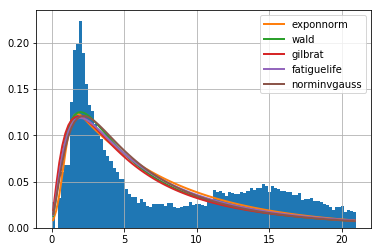

In [19]:
f_RMSD.summary()

It seems the distribution for RMSD is not really fittable by fitter using the default bin size. Let's see if increasing the bins changes anything.

In [12]:
# f = Fitter(data, bins=200, xmin=7.5)
f_RMSD = Fitter(RMSD_values, bins = 1000) # can pass xmin = 7.5 if needed
f_RMSD.fit()

Fitted alpha distribution with error=0.978940106298237)
Fitted anglit distribution with error=2.0625438463470362)
Fitted arcsine distribution with error=2.8564174236247464)
Fitted argus distribution with error=2.3512602454268454)
Fitted beta distribution with error=1.7522429360651657)
Fitted betaprime distribution with error=1.1892966444659803)
Fitted bradford distribution with error=1.5037334959006985)
Fitted burr distribution with error=1.3863614200085221)
Fitted burr12 distribution with error=1.243194696407566)
Fitted cauchy distribution with error=1.6764421910743326)
Fitted chi distribution with error=1.3889870974745504)
Fitted chi2 distribution with error=8.412599889255244)
Fitted cosine distribution with error=2.0875971355656793)
Fitted crystalball distribution with error=2.109974693729211)
Fitted dgamma distribution with error=1.6653267309867719)
Fitted dweibull distribution with error=1.4776339383629558)
Fitted erlang distribution with error=1.1870532885837508)
Fitted expon dis

,sumsquare_error
exponnorm,0.848019
wald,0.854495
gilbrat,0.886847
fatiguelife,0.900127
norminvgauss,0.923258


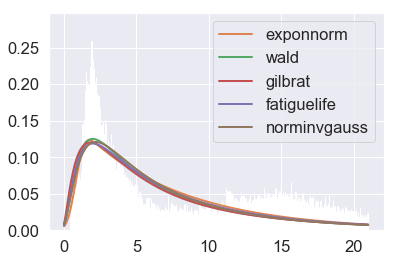

In [13]:
f_RMSD.summary()

It seems that automatic fitting is not working. More likely, this is a bimodal distribution.

[ 11.8673043    9.8654873  174.8974267    2.16108056   0.87748361
 798.68105068] 
 [ 0.8099839   1.69396005  8.40581335  0.02836555  0.03816138 26.6748341 ]


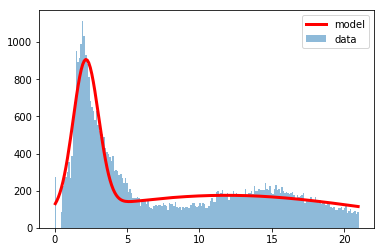

In [17]:


# https://stackoverflow.com/questions/37559470/what-do-all-the-distributions-available-in-scipy-stats-look-like

# https://stackoverflow.com/questions/35990467/fit-two-gaussians-to-a-histogram-from-one-set-of-data-python

# https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hist.html
# hist() returns a tuple, with the last element being a silent list of patches, so we assign this to special variable '_'
# https://hackernoon.com/understanding-the-underscore-of-python-309d1a029edc
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.curve_fit.html
# https://docs.scipy.org/doc/numpy/reference/generated/numpy.diag.html

y, x, _ = hist(df['RMSD'], 200, alpha = 0.5, label = 'data')

x=(x[1:]+x[:-1])/2 # for len(x)==len(y)

def gauss(x,mu,sigma,A):
    return A*exp(-(x-mu)**2/2/sigma**2)

def bimodal(x,mu1,sigma1,A1,mu2,sigma2,A2):
    return gauss(x,mu1,sigma1,A1)+gauss(x,mu2,sigma2,A2)

#expected=(1,.2,250,2,.2,125)
# expected=(5,.2,1,20,.5,1) # initial estimate for non-linear least square
expected=(15, 9, 150, 2, 0.5, 800)
# curve_fit returns popt (array of optimal params) and pcov (array of est covariance of popt)
params,cov=curve_fit(bimodal,x,y,expected)
sigma=sqrt(diag(cov))
plot(x,bimodal(x,*params),color='red',lw=3,label='model')
legend()
print(params,'\n',sigma) 

From the output above, we obtain two normal distributions that is relatively a good approximation of the RMSD data.

| Distr. | u | sigma | A
| --- | --- | --- | -- |
| Normal1 | 11.8673043 | 9.8654873 | 174.8974267 |
| Normal2 | 2.16108056 | 0.87748361 | 798.68105068 |

However, simulating a dataset following a bimodal normal distribution is tricky with `numpy.random` but doable (ref)[https://stackoverflow.com/questions/4265988/generate-random-numbers-with-a-given-numerical-distribution]. In addition, we can also see that the model curve does not properly follow the experimental distribution.

A better alternative is to perform (inverse transform sampling)[http://www.nehalemlabs.net/prototype/blog/2013/12/16/how-to-do-inverse-transformation-sampling-in-scipy-and-numpy/].

1. (Inverse transform sampling)[https://en.wikipedia.org/wiki/Inverse_transform_sampling], in essence, is a method to rescale a uniform random variable (which is what numpy.random returns - see the Programming for Data Analysis Assignment) into a desired probability distribution.
1. CDF is basically the integral of the histogram, giving us the percentage or the relative count plotted against the data (https://www.andata.at/en/software-blog-reader/why-we-love-the-cdf-and-do-not-like-histograms-that-much.html), with the y axis being [0,1]
1. Inverting the CDF allows sampling of the uniform values (because this x-axis is now [0,1]) and transform into target distribution.




In [7]:
# http://www.nehalemlabs.net/prototype/blog/2013/12/16/how-to-do-inverse-transformation-sampling-in-scipy-and-numpy/

def inverse_transform_sampling(data, n_bins=200, n_samples=40000): # increased the n_bins and samples from the ref above to get a better sampling
    hist, bin_edges = np.histogram(data, bins=n_bins, density=True) # calculate a histogram over the data. density = True calc's a pdf
    cum_values = np.zeros(bin_edges.shape) # returns an array filled with zeros with the dimension of the bin_edges above
    cum_values[1:] = np.cumsum(hist*np.diff(bin_edges)) # cumulative sum of histogram x discrete difference
    inv_cdf = interpolate.interp1d(cum_values, bin_edges) # interpolate over the cumulative sum
    r = np.random.rand(n_samples) # generate a bunch of random numbers
    return inv_cdf(r) # return the random numbers shaped from the interpolate result above

RMSD_synthetic = inverse_transform_sampling(df['RMSD'])

In [8]:
# https://plot.ly/python/histograms/

trace_experimental = go.Histogram(x = df['RMSD'], opacity= 0.75, name = 'experimental', marker = dict(color = 'yellow'))
trace_synthetic = go.Histogram(x = RMSD_synthetic, opacity= 0.75, name = 'synthetic', marker = dict(color = 'magenta'))

data = [trace_experimental, trace_synthetic]
layout = go.Layout(barmode= 'overlay')

fig = go.Figure(data=data, layout=layout)
iplot(fig)

So now we have a synthetic RMSD dataset called RMSD_synthetic, let's look at how we can do something similar to others.

In [15]:
data = df['Total surface area']

f = Fitter(data, bins=200)
f.fit()

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\fitter\fitter.py:144: VisibleDeprecationWarning:

Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:2305: RuntimeWarning:

invalid value encountered in double_scalars



Fitted alpha distribution with error=9.307617563678294e-09)
Fitted anglit distribution with error=2.6442331309717165e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:312: RuntimeWarning:

divide by zero encountered in true_divide



Fitted arcsine distribution with error=4.0188792755270324e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:1615: RuntimeWarning:

invalid value encountered in log

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:6532: RuntimeWarning:

divide by zero encountered in double_scalars



Fitted argus distribution with error=5.208717510571106e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:437: RuntimeWarning:

invalid value encountered in sqrt



Fitted beta distribution with error=1.163187951207487e-08)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:589: RuntimeWarning:

divide by zero encountered in true_divide

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:593: RuntimeWarning:

divide by zero encountered in true_divide

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:1037: RuntimeWarning:

invalid value encountered in subtract



Fitted betaprime distribution with error=7.773714155843452e-09)
Fitted bradford distribution with error=2.09936934045691e-07)
Fitted burr distribution with error=1.788273420184339e-08)
Fitted burr12 distribution with error=1.1758273587365894e-08)
Fitted cauchy distribution with error=3.902912124044303e-08)
Fitted chi distribution with error=5.147851832874038e-08)
Fitted chi2 distribution with error=4.4396006238800983e-07)
Fitted cosine distribution with error=2.2360915420286458e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:1615: RuntimeWarning:

divide by zero encountered in log



Fitted crystalball distribution with error=4.4393618972354384e-07)
Fitted dgamma distribution with error=4.131046793634624e-08)
Fitted dweibull distribution with error=4.6293853758384875e-08)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 3.1500000000000004.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 3.1000000000000005.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 3.166666666666667.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 3.25.

E:\Program Files (x86)\Microsoft Visual

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 4.014926068290199.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 3.9977945265739887.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 4.002077412003041.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 4.047141110208775.

E:\Program Files (x86)\Micr

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value -0.7676575520156634.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 1.4435960127437453.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value -0.030573030429193793.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 1.0750537519505106.

E:\Program Files (x8

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.06845100700372994.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.06981984750026023.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.08347999501817781.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.06667716584771763.

E:\Program Files (x8

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07389082343464382.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07370367752654768.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07382844146527844.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.0744807884284035.

E:\Program Files (x86

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.0738413401950916.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07384151898526742.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07384155540455883.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07384174413031099.

E:\Program Files (x86

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07384157030615585.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07384157643687961.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07384154651003456.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07384154206262206.

E:\Program Files (x8

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07246021760940033.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.0722857608305599.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07244602794865923.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.07250245463216776.

E:\Program Files (x86

Fitted erlang distribution with error=4.439361897232791e-07)
Fitted expon distribution with error=2.0836940091074849e-07)
Fitted exponnorm distribution with error=7.669410875734163e-09)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:1428: RuntimeWarning:

overflow encountered in exp



Fitted exponpow distribution with error=4.4393618972354384e-07)
Fitted exponweib distribution with error=3.3250396881227875e-07)
Fitted f distribution with error=7.738310604641235e-09)
Fitted fatiguelife distribution with error=4.2699034341950086e-07)
Fitted fisk distribution with error=8.932026711599071e-09)
Fitted foldcauchy distribution with error=3.3360560784656715e-08)
Fitted foldnorm distribution with error=4.4393618972354384e-07)
Fitted frechet_l distribution with error=5.475582499213255e-07)
Fitted frechet_r distribution with error=5.984265739849938e-07)
Fitted gamma distribution with error=4.439361897232092e-07)
Fitted gausshyper distribution with error=1.4419873919104e-08)
Fitted genexpon distribution with error=2.0837874958677332e-07)
Fitted genextreme distribution with error=8.487623584888637e-09)
Fitted gengamma distribution with error=1.3297852987296486e-06)
Fitted genhalflogistic distribution with error=1.0600558552660321e-07)
Fitted genlogistic distribution with error=1

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2159: RuntimeWarning:

divide by zero encountered in true_divide



Fitted genpareto distribution with error=1.987889878985596e-07)
Fitted gilbrat distribution with error=1.0324267155427223e-07)
Fitted gompertz distribution with error=4.4393618972354384e-07)
Fitted gumbel_l distribution with error=1.212578411487765e-07)
Fitted gumbel_r distribution with error=1.3234730071958742e-08)
Fitted halfcauchy distribution with error=1.838809937841175e-07)
Fitted halfgennorm distribution with error=6.704675013618497e-07)
Fitted halflogistic distribution with error=1.360031948957939e-07)
Fitted halfnorm distribution with error=1.2194615464127806e-07)
Fitted hypsecant distribution with error=4.153902154490922e-08)
Fitted invgamma distribution with error=8.119716669268166e-09)
Fitted invgauss distribution with error=1.7673571173977315e-07)
Fitted invweibull distribution with error=8.485255542301338e-09)
Fitted johnsonsb distribution with error=8.584199474115381e-09)
Fitted johnsonsu distribution with error=7.86402556603906e-09)
Fitted kappa3 distribution with error

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\integrate\quadpack.py:385: IntegrationWarning:

The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:44: RuntimeWarning:

floating point number truncated to an integer



SKIPPED ksone distribution (taking more than 30 seconds)
Fitted kstwobign distribution with error=1.3633127539410545e-08)
Fitted laplace distribution with error=3.9949281537844054e-08)
Fitted levy distribution with error=1.7669998620216328e-07)
Fitted levy_l distribution with error=3.8124067555225564e-07)
SKIPPED levy_stable distribution (taking more than 30 seconds)
Fitted loggamma distribution with error=6.001248486878677e-08)
Fitted logistic distribution with error=4.651365069529431e-08)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:3785: RuntimeWarning:

divide by zero encountered in true_divide



Fitted loglaplace distribution with error=3.109625451998605e-08)
Fitted lognorm distribution with error=7.891827072189993e-09)
Fitted lomax distribution with error=1.6548582454369025e-07)
Fitted maxwell distribution with error=3.477055538614231e-08)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\integrate\quadpack.py:385: IntegrationWarning:

Extremely bad integrand behavior occurs at some points of the
  integration interval.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\integrate\quadpack.py:385: IntegrationWarning:

The integral is probably divergent, or slowly convergent.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4064: RuntimeWarning:

overflow encountered in power

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4064: RuntimeWarning:

overflow encountered in multiply

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4064: RuntimeWarning:

invalid value encountered in true_divide



Fitted mielke distribution with error=3.6909655738222106e-08)
Fitted moyal distribution with error=7.39047865988018e-09)
Fitted nakagami distribution with error=2.6583861261392813e-08)
SKIPPED ncf distribution (taking more than 30 seconds)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4768: RuntimeWarning:

invalid value encountered in multiply

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4764: RuntimeWarning:

overflow encountered in multiply



SKIPPED nct distribution (taking more than 30 seconds)
SKIPPED ncx2 distribution (taking more than 30 seconds)
Fitted norm distribution with error=5.86128255133035e-08)
Fitted norminvgauss distribution with error=9.706168545460771e-09)
Fitted pareto distribution with error=5.378942676800935e-07)
Fitted pearson3 distribution with error=1.1494848925990269e-08)
Fitted powerlaw distribution with error=3.0483814129743054e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5166: RuntimeWarning:

divide by zero encountered in power

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5166: RuntimeWarning:

invalid value encountered in multiply

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5166: RuntimeWarning:

overflow encountered in power



Fitted powerlognorm distribution with error=7.009205217850551e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5203: RuntimeWarning:

divide by zero encountered in power

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5203: RuntimeWarning:

invalid value encountered in multiply



Fitted powernorm distribution with error=nan)
Fitted rayleigh distribution with error=2.6410831763062015e-08)
Fitted rdist distribution with error=5.8508622868641635e-08)
Fitted recipinvgauss distribution with error=5.52522373260582e-08)
Fitted reciprocal distribution with error=4.4393618972354384e-07)
Fitted rice distribution with error=2.6410834661268634e-08)
SKIPPED rv_continuous distribution (taking more than 30 seconds)
SKIPPED rv_histogram distribution (taking more than 30 seconds)
Fitted semicircular distribution with error=2.954881716555657e-07)
Fitted skewnorm distribution with error=1.1977094069606781e-08)
Fitted t distribution with error=4.6412203223467945e-08)
Fitted trapz distribution with error=4.4741147750382384e-07)
Fitted triang distribution with error=1.543016480645172e-07)
Fitted truncexpon distribution with error=2.3119503403793576e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5823: RuntimeWarning:

divide by zero encountered in log

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5823: RuntimeWarning:

invalid value encountered in log

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5883: RuntimeWarning:

divide by zero encountered in power



Fitted truncnorm distribution with error=4.4393618972354384e-07)
SKIPPED tukeylambda distribution (taking more than 30 seconds)
Fitted uniform distribution with error=3.0279135113389505e-07)
Fitted vonmises distribution with error=2.790700791955356e+49)
Fitted vonmises_line distribution with error=5.497563469251597e-08)
Fitted wald distribution with error=6.7402216085194e-08)
Fitted weibull_max distribution with error=5.475582499213255e-07)
Fitted weibull_min distribution with error=5.984265739849938e-07)
Fitted wrapcauchy distribution with error=nan)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\optimize\optimize.py:563: RuntimeWarning:

invalid value encountered in subtract

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning:

invalid value encountered in reduce



<IPython.core.display.Javascript object>


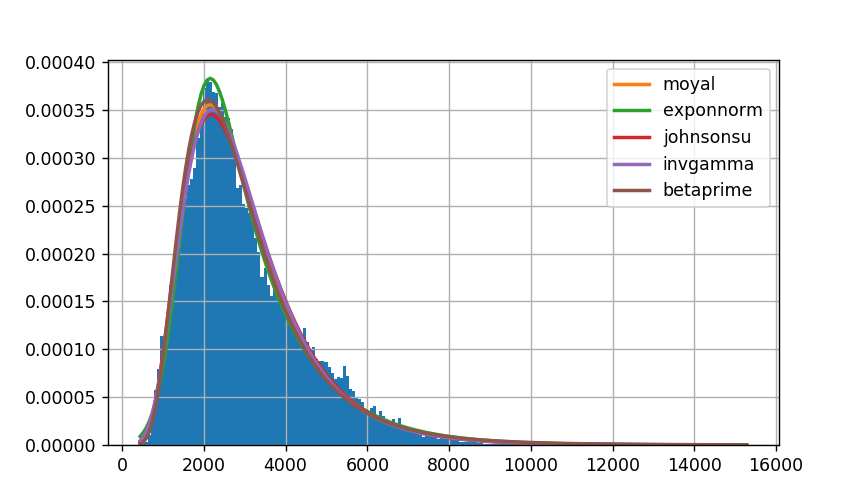

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\matplotlib\axes\_axes.py:6521: MatplotlibDeprecationWarning:


The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.



,sumsquare_error
moyal,7.390479e-09
exponnorm,7.669411e-09
f,7.738311e-09
betaprime,7.773714e-09
johnsonsu,7.864026e-09


In [17]:
f.summary()

In contrast to the RMSD data, it seems the Total surface area can be easily approximated by these 5 distributions. However, looking at the (`numpy.random` documentation)[https://www.numpy.org/devdocs/reference/routines.random.html], the only standard method to generate random numbers is through the `numpy.random.f` (F distribution). This is one of the main problems of fitting a curve first and then trying to figure out how to generate random numbers that follows a particular distribution. The inverse transform sampling is much easier.

In any case, for illustrative purposes, we will use the F distribution.

Let's first generate moyal because it has the lowest error, though all of them are actually relatively similar.

And then we will use inverse transform sampling to make another set of random numbers. Overlay all for comparison.

In [22]:
f.fitted_param['f']

(2361.6060387471257, 13.72970737340411, -33.606132263020314, 8509.57037876677)

From scipy documentation, the F pdf is of the form pdf(x, dfn, dfd, loc=0, scale=1) meaning:

dfn: 2361.6060387471257
dfd: 13.72970737340411
loc: -33.606132263020314
scale: 8509.57037876677

In [33]:
# generate random numbers according to F distribution

TotalArea_random = (np.random.f(2361.6060387471257, 13.72970737340411, 40000) * 8509.57037876677 ) + 33.606132263020314
TotalArea_random

array([ 9018.54194402,  7979.44359863,  6750.37806012, ...,
        7364.68497273, 12166.98464908, 12313.88089439])

In [61]:
TotalArea_synthetic = inverse_transform_sampling(df['Total surface area'])


trace_experimental = go.Histogram(x = df['Total surface area'], opacity= 0.75, name = 'experimental',
                                  marker = dict(color = 'yellow'))
trace_synthetic = go.Histogram(x = TotalArea_synthetic, opacity= 0.75, name = 'synthetic',
                                   marker = dict(color = 'magenta'))

trace_random = go.Histogram(x = TotalArea_random, opacity= 0.5, name = 'random',
                                   marker = dict(color = 'blue'))

data = [trace_experimental, trace_synthetic, trace_random]

# https://plot.ly/python/text-and-annotations/

layout = go.Layout(barmode = 'overlay',
    annotations=[
        dict(
            x=15000,
            y=350,
            xref='x',
            yref='y',
            text='<i>shoulder not captured by curve fitting of <br>standard distribution</i>',
            showarrow=True,
            arrowhead=2,
            arrowwidth = 2,
            arrowsize = 1,
            ax=200,
            ay=-40,
            align = 'center'
        )
    ]
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

While our random numbers closely mimic the experimental data, it does not fully capture the subtleties present, for instance, the shoulder around (x = 15k, y = 380) (annotated above).

Let's look at Non-polar exposed area now.

In [63]:
f = Fitter(df['Non-polar exposed area'], bins=200)
f.fit()

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\fitter\fitter.py:144: VisibleDeprecationWarning:

Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:2305: RuntimeWarning:

invalid value encountered in double_scalars



Fitted alpha distribution with error=2.983485774879999e-08)
Fitted anglit distribution with error=1.965551175877856e-06)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:312: RuntimeWarning:

divide by zero encountered in true_divide



Fitted arcsine distribution with error=2.737591609253071e-06)
Fitted argus distribution with error=2.3391274361932906e-06)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:437: RuntimeWarning:

invalid value encountered in sqrt



Fitted beta distribution with error=4.242601289153049e-08)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:589: RuntimeWarning:

divide by zero encountered in true_divide

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:593: RuntimeWarning:

divide by zero encountered in true_divide

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:1037: RuntimeWarning:

invalid value encountered in subtract



Fitted betaprime distribution with error=2.5373969801282136e-08)
Fitted bradford distribution with error=1.5236461010381615e-06)
Fitted burr distribution with error=1.8310750455749938e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:768: RuntimeWarning:

overflow encountered in power



Fitted burr12 distribution with error=2.8050267540803408e-06)
Fitted cauchy distribution with error=2.561717556582485e-07)
Fitted chi distribution with error=2.6806533568135845e-07)
Fitted chi2 distribution with error=4.4334229426044796e-08)
Fitted cosine distribution with error=1.6952617380753156e-06)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_distn_infrastructure.py:1615: RuntimeWarning:

divide by zero encountered in log



Fitted crystalball distribution with error=3.1026346622462154e-06)
Fitted dgamma distribution with error=2.5175094417121214e-07)
Fitted dweibull distribution with error=2.5599705402831093e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 2.1.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 2.0666666666666664.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 2.1111111111111107.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 2.166666666666666.

E:\Program Files (x86)\Microsoft Visual 

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value -0.07092635728917322.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.1035746862675321.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.022930676687618126.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value -0.006684322264971981.

E:\Program Files 

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.029741554979679438.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.029239772125115984.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.030298693212792216.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 0.030093524470905193.

E:\Program Files

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 57.09984379130828.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 57.417855803754364.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 56.7501599184827.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 56.446837566324376.

E:\Program Files (x86)\Micr

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 55.52461259357949.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 55.66223092767251.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 55.46737063839906.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 55.47662440789193.

E:\Program Files (x86)\Micro

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 85.31205372941326.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 85.32650901113752.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 85.31834069100664.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 85.3227150427987.

E:\Program Files (x86)\Micros

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 85.32401289615547.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 85.3247914599963.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 85.32432538105061.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2562: RuntimeWarning:

The shape parameter of the erlang distribution has been given a non-integer value 85.32453963915663.

E:\Program Files (x86)\Micros

Fitted erlang distribution with error=2.775254147669356e-07)
Fitted expon distribution with error=1.3744747429421342e-06)
Fitted exponnorm distribution with error=2.1297040318082135e-08)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:1428: RuntimeWarning:

overflow encountered in exp



Fitted exponpow distribution with error=3.1026346622462154e-06)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:1380: RuntimeWarning:

invalid value encountered in add



Fitted exponweib distribution with error=8.483480359115294e-06)
Fitted f distribution with error=2.59655939642015e-08)
Fitted fatiguelife distribution with error=2.6158521090943485e-06)
Fitted fisk distribution with error=2.9713796203505477e-08)
Fitted foldcauchy distribution with error=1.8740387432161001e-07)
Fitted foldnorm distribution with error=3.1026346622462154e-06)
Fitted frechet_l distribution with error=3.946496439325201e-06)
Fitted frechet_r distribution with error=4.174806507576728e-06)
Fitted gamma distribution with error=2.642683219911558e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:3080: RuntimeWarning:

invalid value encountered in power



Fitted gausshyper distribution with error=8.844734278827149e-08)
Fitted genexpon distribution with error=1.3743383177794053e-06)
Fitted genextreme distribution with error=2.5377829627099664e-08)
Fitted gengamma distribution with error=4.002530258868966e-06)
Fitted genhalflogistic distribution with error=6.63198333837289e-07)
Fitted genlogistic distribution with error=5.4023532885515246e-08)
Fitted gennorm distribution with error=2.56876615072033e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:2159: RuntimeWarning:

divide by zero encountered in true_divide



Fitted genpareto distribution with error=1.1346447555192557e-06)
Fitted gilbrat distribution with error=6.53122576735976e-07)
Fitted gompertz distribution with error=3.1026346622462154e-06)
Fitted gumbel_l distribution with error=8.507980098486651e-07)
Fitted gumbel_r distribution with error=5.2977512584763684e-08)
Fitted halfcauchy distribution with error=1.2126313673264857e-06)
Fitted halfgennorm distribution with error=4.413255043841479e-06)
Fitted halflogistic distribution with error=8.673416230962804e-07)
Fitted halfnorm distribution with error=7.676823124427591e-07)
Fitted hypsecant distribution with error=2.385832267295911e-07)
Fitted invgamma distribution with error=2.4080163091823712e-08)
Fitted invgauss distribution with error=3.1547317696072953e-07)
Fitted invweibull distribution with error=2.537665765145578e-08)
Fitted johnsonsb distribution with error=2.8165095317370565e-08)
Fitted johnsonsu distribution with error=2.376106938626486e-08)
Fitted kappa3 distribution with err

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\integrate\quadpack.py:385: IntegrationWarning:

The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:44: RuntimeWarning:

floating point number truncated to an integer



SKIPPED ksone distribution (taking more than 30 seconds)
Fitted kstwobign distribution with error=5.9527902352873096e-08)
Fitted laplace distribution with error=2.542862582200027e-07)
Fitted levy distribution with error=1.183105911973679e-06)
Fitted levy_l distribution with error=2.7136781706649113e-06)
SKIPPED levy_stable distribution (taking more than 30 seconds)
Fitted loggamma distribution with error=3.7566453795611375e-07)
Fitted logistic distribution with error=2.682933129384358e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:3785: RuntimeWarning:

divide by zero encountered in true_divide



Fitted loglaplace distribution with error=1.842118851040653e-07)
Fitted lognorm distribution with error=6.38335534193188e-06)
Fitted lomax distribution with error=1.196049673045951e-06)
Fitted maxwell distribution with error=2.0043067475496183e-07)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\integrate\quadpack.py:385: IntegrationWarning:

Extremely bad integrand behavior occurs at some points of the
  integration interval.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\integrate\quadpack.py:385: IntegrationWarning:

The integral is probably divergent, or slowly convergent.

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4064: RuntimeWarning:

overflow encountered in power

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4064: RuntimeWarning:

overflow encountered in multiply

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4064: RuntimeWarning:

invalid value encountered in true_divide



Fitted mielke distribution with error=2.554238665949055e-07)
Fitted moyal distribution with error=2.0238142655096262e-08)
Fitted nakagami distribution with error=1.4197445155713033e-07)
SKIPPED ncf distribution (taking more than 30 seconds)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4768: RuntimeWarning:

invalid value encountered in multiply

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:4764: RuntimeWarning:

overflow encountered in multiply



SKIPPED nct distribution (taking more than 30 seconds)
SKIPPED ncx2 distribution (taking more than 30 seconds)
Fitted norm distribution with error=3.6454387055494715e-07)
Fitted norminvgauss distribution with error=2.6018261081626175e-08)
Fitted pareto distribution with error=5.034370547667858e-06)
Fitted pearson3 distribution with error=4.226746547265975e-08)
Fitted powerlaw distribution with error=2.217328770537612e-06)
Fitted powerlognorm distribution with error=8.302459857831769e-06)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5203: RuntimeWarning:

divide by zero encountered in power

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5203: RuntimeWarning:

invalid value encountered in multiply



Fitted powernorm distribution with error=nan)
Fitted rayleigh distribution with error=1.4258284806921692e-07)
Fitted rdist distribution with error=3.638439857697126e-07)
Fitted recipinvgauss distribution with error=3.4707890394862285e-07)
Fitted reciprocal distribution with error=3.1026346622462154e-06)
Fitted rice distribution with error=1.425828255944443e-07)
SKIPPED rv_continuous distribution (taking more than 30 seconds)
SKIPPED rv_histogram distribution (taking more than 30 seconds)
Fitted semicircular distribution with error=2.1679499774323315e-06)
Fitted skewnorm distribution with error=5.658892202138268e-08)
Fitted t distribution with error=2.568959626993255e-07)
Fitted trapz distribution with error=3.1824552700671225e-06)
Fitted triang distribution with error=1.212982918871762e-06)
Fitted truncexpon distribution with error=1.6586721894870962e-06)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5823: RuntimeWarning:

divide by zero encountered in log

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5823: RuntimeWarning:

invalid value encountered in log



Fitted truncnorm distribution with error=3.1026346622462154e-06)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\stats\_continuous_distns.py:5883: RuntimeWarning:

divide by zero encountered in power



SKIPPED tukeylambda distribution (taking more than 30 seconds)
Fitted uniform distribution with error=2.2028012890035853e-06)
Fitted vonmises distribution with error=3.1516841165165917e+49)
Fitted vonmises_line distribution with error=3.401520272900291e-07)
Fitted wald distribution with error=4.3392250837955674e-07)
Fitted weibull_max distribution with error=3.946496439325201e-06)
Fitted weibull_min distribution with error=4.174806507576728e-06)
Fitted wrapcauchy distribution with error=nan)


E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\scipy\optimize\optimize.py:563: RuntimeWarning:

invalid value encountered in subtract

E:\Program Files (x86)\Microsoft Visual Studio\Shared\Python37_64\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning:

invalid value encountered in reduce



In [65]:
f.summary()

,sumsquare_error
moyal,2.023814e-08
exponnorm,2.129704e-08
johnsonsu,2.376107e-08
invgamma,2.408016e-08
betaprime,2.537397e-08


In [ ]:
f = Fitter(df.iloc[:, 3], bins=200)
f.fit()
f.summary()

In [ ]:
f = Fitter(df.iloc[:, 4], bins=200)
f.fit()
f.summary()

In [ ]:
f = Fitter(df.iloc[:, 5], bins=200)
f.fit()
f.summary()

In [ ]:
f = Fitter(df.iloc[:, 6], bins=200)
f.fit()
f.summary()

In [ ]:
f = Fitter(df.iloc[:, 7], bins=200)
f.fit()
f.summary()

In [ ]:
f = Fitter(df.iloc[:, 8], bins=200)
f.fit()
f.summary()

In [ ]:
f = Fitter(df.iloc[:, 9], bins=200)
f.fit()
f.summary()

In [ ]:
trace0 = go.Histogram(x=df.iloc[:, 0])

data = [trace0]

fig = go.Figure(data=data)
iplot(fig)

## Discussion

## Conclusion